<a href="https://colab.research.google.com/github/lyxuantin113/EditorProject/blob/main/Testing_Function.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install lib

In [1]:
!pip install insightface onnxruntime onnx dlib opencv-python

In [2]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import dlib

#Face Swap

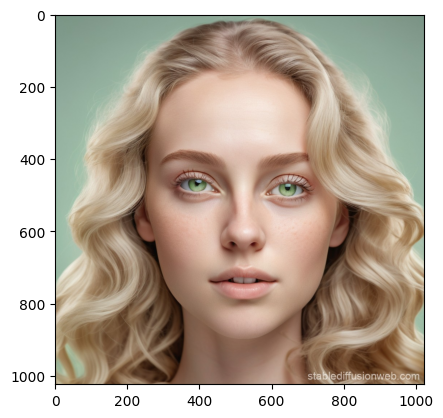

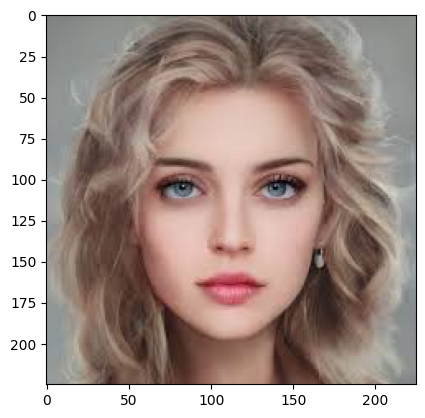

In [19]:
# Đọc 2 ảnh cần hoán đổi khuôn mặt
img1 = cv2.imread("/content/drive/MyDrive/CV_Lab/f1.jpg")  # Ảnh nguồn
img2 = cv2.imread("/content/drive/MyDrive/CV_Lab/f2.jpg")  # Ảnh đích
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.show()
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.show()

### Resize

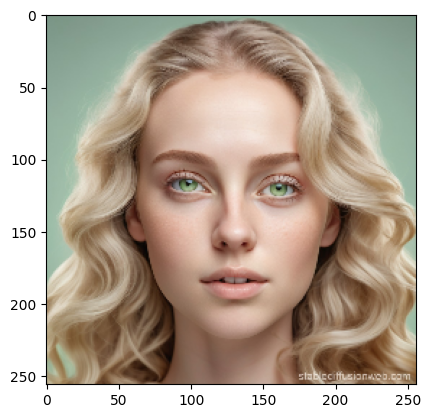

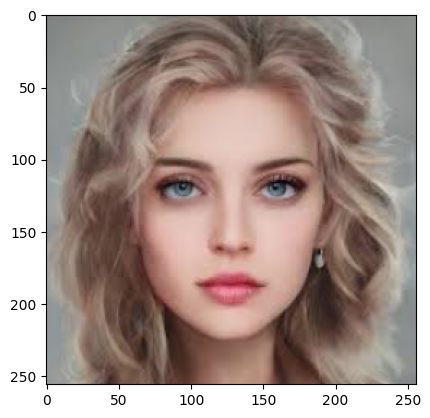

In [20]:
# Resize 2 face
img1 = cv2.resize(img1, (256, 256))
img2 = cv2.resize(img2, (256, 256))

plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.show()
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.show()

### Blur

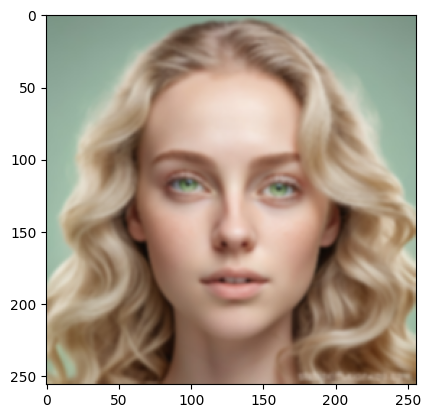

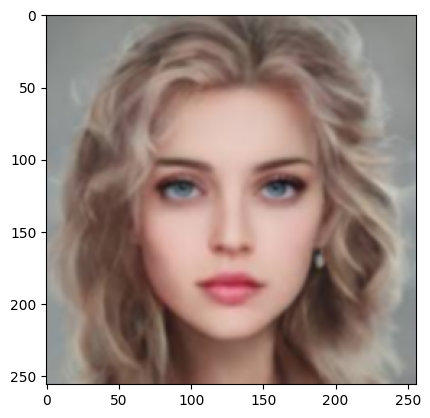

In [21]:
# Blur
img1_blur = cv2.GaussianBlur(img1, (5, 5), 0)
img2_blur = cv2.GaussianBlur(img2, (5, 5), 0)
plt.imshow(cv2.cvtColor(img1_blur, cv2.COLOR_BGR2RGB))
plt.show()
plt.imshow(cv2.cvtColor(img2_blur, cv2.COLOR_BGR2RGB))
plt.show()

### Làm nét (Test alpha)

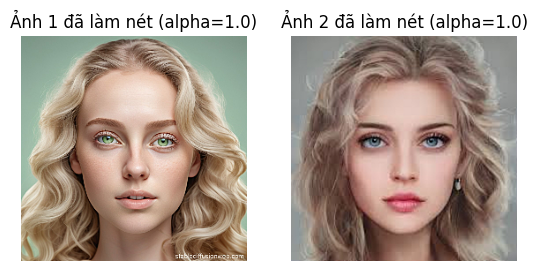

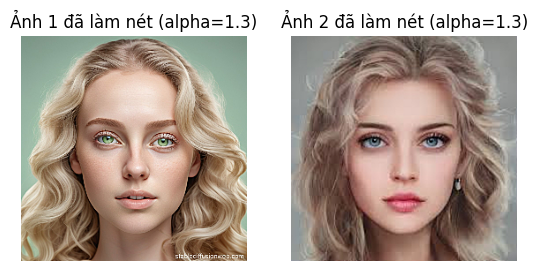

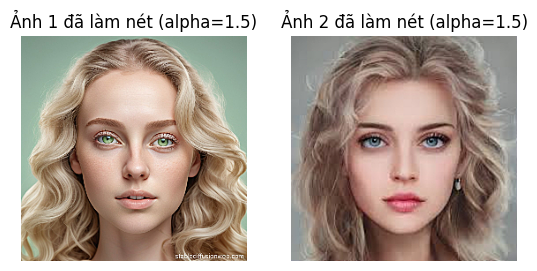

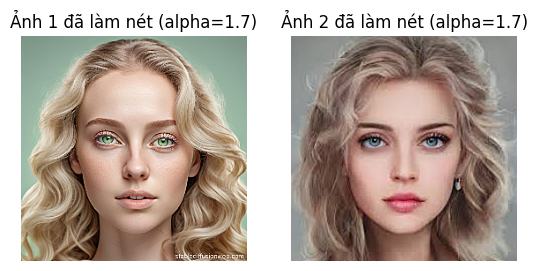

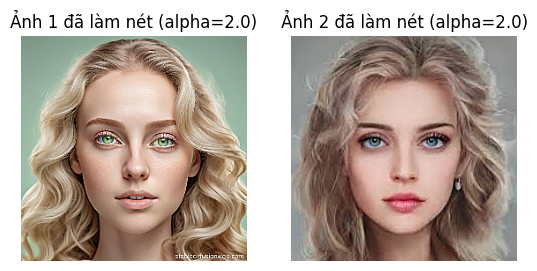

In [22]:
# Tạo ảnh làm nét bằng Unsharp Masking
# CHO ALPHA là THANH KÉO (1 -> 2)
alphas = np.array([1, 1.3, 1.5, 1.7, 2])  # Hệ số làm nét, có thể điều chỉnh từ 1.0 đến 2.0

for alpha in alphas:
    sharpened1 = cv2.addWeighted(img1, 1 + alpha, img1_blur, -alpha, 0)
    sharpened2 = cv2.addWeighted(img2, 1 + alpha, img2_blur, -alpha, 0)

    # Hiển thị ảnh gốc và ảnh đã làm nét
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(sharpened1, cv2.COLOR_BGR2RGB))
    plt.title(f'Ảnh 1 đã làm nét (alpha={alpha})')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(sharpened2, cv2.COLOR_BGR2RGB))
    plt.title(f'Ảnh 2 đã làm nét (alpha={alpha})')
    plt.axis('off')

    plt.show()

### Làm nét (Test swap face)

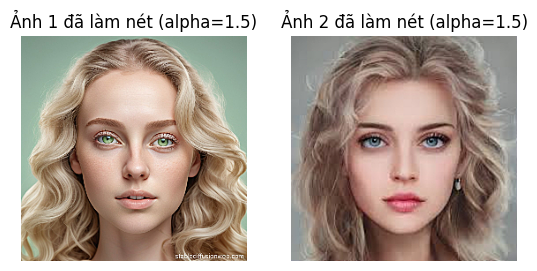

In [23]:
# Ví dụ chọn 1.5
alpha = 1.5

sharpened1 = cv2.addWeighted(img1, 1 + alpha, img1_blur, -alpha, 0)
sharpened2 = cv2.addWeighted(img2, 1 + alpha, img2_blur, -alpha, 0)

# Hiển thị ảnh gốc và ảnh đã làm nét
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(sharpened1, cv2.COLOR_BGR2RGB))
plt.title(f'Ảnh 1 đã làm nét (alpha={alpha})')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(sharpened2, cv2.COLOR_BGR2RGB))
plt.title(f'Ảnh 2 đã làm nét (alpha={alpha})')
plt.axis('off')

plt.show()

### Processes

In [24]:
from insightface.app import FaceAnalysis

# # Khởi tạo mô hình InsightFace (bao gồm detection và recognition)
# app = FaceAnalysis(providers=['CUDAExecutionProvider', 'CPUExecutionProvider'],
#                    allowed_modules=['detection', 'recognition'])
# app.prepare(ctx_id=0, det_thresh=0.5, det_size=(640, 640))

In [25]:
from insightface.app import FaceAnalysis

# Khởi tạo FaceAnalysis với mô hình đã tải
app = FaceAnalysis(name='scrfd_10g_bnkps', root='/content/drive/MyDrive/CV_Lab', providers=['CPUExecutionProvider'],
                   allowed_modules=['detection', 'recognition'])
app.prepare(ctx_id=0, det_size=(640, 640))

Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /content/drive/MyDrive/CV_Lab/models/scrfd_10g_bnkps/scrfd_10g_bnkps.onnx detection [1, 3, '?', '?'] 127.5 128.0
set det-size: (640, 640)


In [26]:
print(app.models)

{'detection': <insightface.model_zoo.retinaface.RetinaFace object at 0x7f8c4c896a50>}


In [27]:
predictor_path = "/content/drive/MyDrive/CV_Lab/shape_predictor_68_face_landmarks.dat"
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

### Draw (Test nhận diện)

In [28]:
sharpened1_copy = sharpened1.copy()
sharpened2_copy = sharpened2.copy()

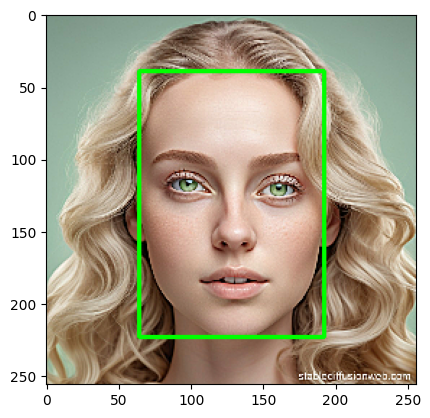

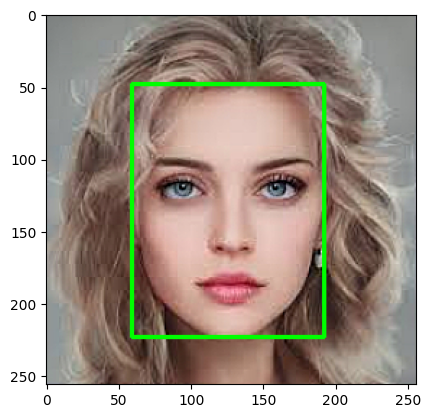

In [29]:
# 1. Phát hiện khuôn mặt bằng SCRFD
faces1 = app.get(sharpened1_copy)
faces2 = app.get(sharpened2_copy)

def draw_face_detected(img, faces):
    for face in faces:
        box = face.bbox.astype(int)
        cv2.rectangle(img, (box[0], box[1]), (box[2], box[3]), (0, 255, 0), 2)

draw_face_detected(sharpened1_copy, faces1)
draw_face_detected(sharpened2_copy, faces2)

plt.imshow(cv2.cvtColor(sharpened1_copy, cv2.COLOR_BGR2RGB))
plt.show()
plt.imshow(cv2.cvtColor(sharpened2_copy, cv2.COLOR_BGR2RGB))
plt.show()

In [30]:
def draw_landmarks(img_rgb, faces):
    for face in faces:
      x1, y1, x2, y2 = map(int, face.bbox)

      # Cắt vùng khuôn mặt
      face_crop = img_rgb[y1:y2, x1:x2]

      # Chuyển sang ảnh xám để Dlib xử lý
      face_gray = cv2.cvtColor(face_crop, cv2.COLOR_RGB2GRAY)
      rect = dlib.rectangle(0, 0, face_crop.shape[1], face_crop.shape[0])

      # Phát hiện landmark
      landmarks = predictor(face_gray, rect)

      # 3. Vẽ landmark lên ảnh gốc
      for n in range(0, 68):
          x = landmarks.part(n).x + x1
          y = landmarks.part(n).y + y1
          cv2.circle(img_rgb, (x, y), 2, (0, 255, 0), -1)

      return np.array([[p.x, p.y] for p in landmarks.parts()])

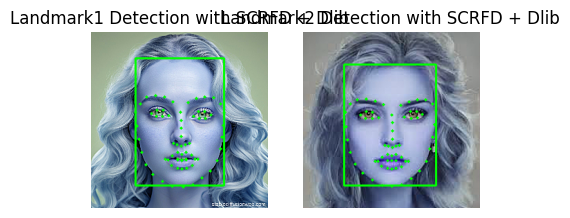

In [31]:
# TEST 2 lấy landmarks

landmarks1 = draw_landmarks(sharpened1_copy, faces1)
landmarks2 = draw_landmarks(sharpened2_copy, faces1)
# Hiển thị kết quả
plt.figure(figsize=(5, 5))
plt.subplot(1, 2, 1)
plt.imshow(sharpened1_copy)
plt.axis('off')
plt.title("Landmark1 Detection with SCRFD + Dlib")

plt.subplot(1, 2, 2)
plt.imshow(sharpened2_copy)
plt.axis('off')
plt.title("Landmark2 Detection with SCRFD + Dlib")
plt.show()

### Processing

In [32]:
# 1. Resize

def resize_image_to_match(source_img, target_img):
    target_h, target_w = target_img.shape[:2]
    return cv2.resize(source_img, (target_w, target_h), interpolation=cv2.INTER_LINEAR)

# 2. Hàm lấy Landmark lấy 68 điểm mốc -> shape (N,2), N = 68

def get_landmarks(img, face, predictor):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    landmarks = predictor(gray, face)
    return np.array([[p.x, p.y] for p in landmarks.parts()], dtype=np.int32)

# 3. Tạo mặt nạ từ Landmark

def get_face_mask(img, landmarks, indices):
    mask = np.zeros(img.shape[:2], dtype=np.float64)
    selected_points = landmarks[indices]
    points = cv2.convexHull(selected_points)
    cv2.fillConvexPoly(mask, points, 1)
    mask = np.array([mask, mask, mask]).transpose((1, 2, 0))
    return mask

# 4. Tự động căn chỉnh khuôn mặt

def align_faces(src_landmarks, dst_landmarks):
    # Chỉ lấy các điểm mắt, mũi và miệng để căn chỉnh
    key_indices = list(range(36, 48)) + list(range(27, 36)) + list(range(48, 68))

    src_key_points = src_landmarks[key_indices]
    dst_key_points = dst_landmarks[key_indices]

    # Tính trung tâm các đặc điểm cần hoán đổi
    src_center = np.mean(src_key_points, axis=0)
    dst_center = np.mean(dst_key_points, axis=0)

    # Tính tỷ lệ giữa khoảng cách mắt và miệng để điều chỉnh kích thước
    src_eye_distance = np.linalg.norm(src_landmarks[36] - src_landmarks[45])
    dst_eye_distance = np.linalg.norm(dst_landmarks[36] - dst_landmarks[45])

    src_mouth_distance = np.linalg.norm(src_landmarks[48] - src_landmarks[54])
    dst_mouth_distance = np.linalg.norm(dst_landmarks[48] - dst_landmarks[54])

    scale_eye = dst_eye_distance / src_eye_distance
    scale_mouth = dst_mouth_distance / src_mouth_distance
    scale_factor = (scale_eye + scale_mouth) / 2

    # Tạo ma trận biến đổi với tỷ lệ và dịch chuyển để đặt vào trung tâm
    M = cv2.getRotationMatrix2D(tuple(src_center), 0, scale_factor)
    M[0, 2] += dst_center[0] - src_center[0]
    M[1, 2] += dst_center[1] - src_center[1]

    return M

# 5. Hoán đổi mắt, mũi và miệng

def swap_facial_features(src_img, dst_img, src_landmarks, dst_landmarks):
    # Chỉ lấy các điểm mắt, mũi và miệng
    key_indices = list(range(36, 48)) + list(range(27, 36)) + list(range(48, 68))

    # Căn chỉnh khuôn mặt
    M = align_faces(src_landmarks, dst_landmarks)
    src_img_aligned = cv2.warpAffine(src_img, M, (dst_img.shape[1], dst_img.shape[0]))

    # Tạo mặt nạ từ các điểm đặc trưng
    mask = get_face_mask(dst_img, dst_landmarks, key_indices)

    # Tạo ảnh chứa các đặc điểm đã được hoán đổi
    swapped_face = np.copy(dst_img)
    swapped_face = np.where(mask == 1, src_img_aligned, swapped_face)

    # Tìm trung tâm khuôn mặt để seamless clone
    center = (int(np.mean(dst_landmarks[:, 0])), int(np.mean(dst_landmarks[:, 1])))

    # Áp dụng seamless cloning để làm mượt kết quả
    output = seamless_clone(swapped_face, dst_img, mask, center)

    return output

# 6. Blend tự nhiên

def seamless_clone(src_face, dst_img, mask, center):
    return cv2.seamlessClone(src_face.astype(np.uint8), dst_img, (mask * 255).astype(np.uint8), center, cv2.NORMAL_CLONE)


In [33]:
# 7. Thực hiện Face Swap

def face_swap(src_img, dst_img):
    src_img_resized = resize_image_to_match(src_img, dst_img)

    faces_src = detector(cv2.cvtColor(src_img_resized, cv2.COLOR_BGR2GRAY))
    faces_dst = detector(cv2.cvtColor(dst_img, cv2.COLOR_BGR2GRAY))

    if len(faces_src) == 0 or len(faces_dst) == 0:
        print("Không tìm thấy khuôn mặt trong một trong hai ảnh!")
        exit()

    landmarks_src = get_landmarks(src_img_resized, faces_src[0], predictor)
    landmarks_dst = get_landmarks(dst_img, faces_dst[0], predictor)

    # Hoán đổi mắt, mũi và miệng
    output = swap_facial_features(src_img_resized, dst_img, landmarks_src, landmarks_dst)

    return output

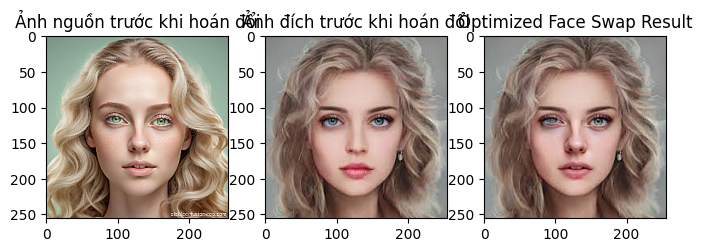

In [34]:
# 8. Đọc ảnh và hoán đổi
result = face_swap(sharpened1, sharpened2)

# 9. Hiển thị kết quả
plt.figure(figsize=(8, 8))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(sharpened1, cv2.COLOR_BGR2RGB))
plt.title("Ảnh nguồn trước khi hoán đổi")

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(sharpened2, cv2.COLOR_BGR2RGB))
plt.title("Ảnh đích trước khi hoán đổi")

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title("Optimized Face Swap Result")
plt.show()

# Hàm nhỏ

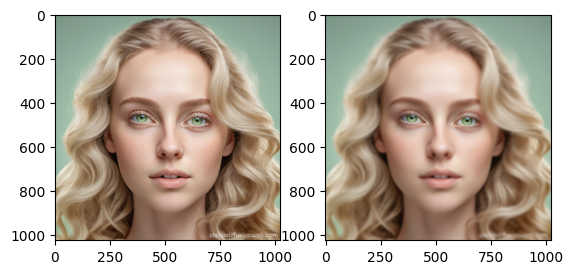

In [ ]:
# Làm mờ nền
# Áp dụng hàm 2 và 3
img = cv2.imread("/content/drive/MyDrive/CV_Lab/f1.jpg")
f = app.get(img)
f_detector = detector(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY))
lm = get_landmarks(img, f_detector[0], predictor)
mask = get_face_mask(img, lm, list(range(36, 48)))
blurred_background = cv2.GaussianBlur(img, (21, 21), 0)
final_image = (img * mask + blurred_background * (1 - mask)).astype(np.uint8)

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB))
plt.show()

# Filter

In [ ]:
from insightface.app import FaceAnalysis

In [ ]:
# Khởi tạo mô hình InsightFace (bao gồm detection và landmark)
app = FaceAnalysis(providers=['CUDAExecutionProvider', 'CPUExecutionProvider'],
                   allowed_modules=['detection', 'recognition', 'landmark'])
app.prepare(ctx_id=0, det_thresh=0.5, det_size=(640, 640))

download_path: /root/.insightface/models/buffalo_l


100%|██████████| 281857/281857 [00:04<00:00, 65798.10KB/s]
/usr/local/lib/python3.11/dist-packages/onnxruntime/capi/onnxruntime_inference_collection.py:115: UserWarning: Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'AzureExecutionProvider, CPUExecutionProvider'
  warnings.warn(


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
model ignore: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
model ignore: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
model ignore: /root/.insightface/models/buffalo_l/genderage.onnx genderage
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size: (640, 640)


In [ ]:
predictor_path = "/content/drive/MyDrive/CV_Lab/shape_predictor_68_face_landmarks.dat"
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(predictor_path)

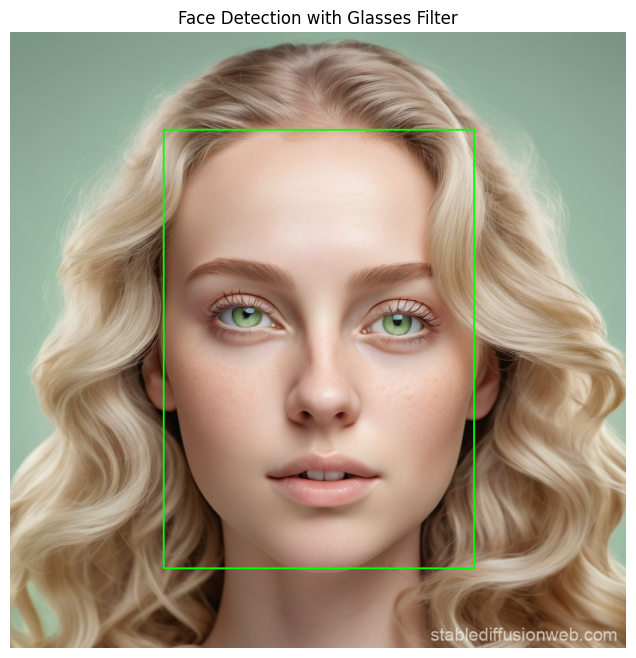

In [ ]:
# Tải ảnh đầu vào
imgf_path = "/content/drive/MyDrive/CV_Lab/f1.jpg"  # Thay bằng ảnh của bạn
imgf = cv2.imread(imgf_path)
imgf_rgb = cv2.cvtColor(imgf, cv2.COLOR_BGR2RGB)

# Phát hiện khuôn mặt và landmark
faces = app.get(imgf)

for face in faces:
    box = face.bbox.astype(int)
    cv2.rectangle(imgf_rgb, (box[0], box[1]), (box[2], box[3]), (0, 255, 0), 2)

plt.figure(figsize=(8, 8))
plt.imshow(imgf_rgb)
plt.axis('off')
plt.title("Face Detection with Glasses Filter")
plt.show()

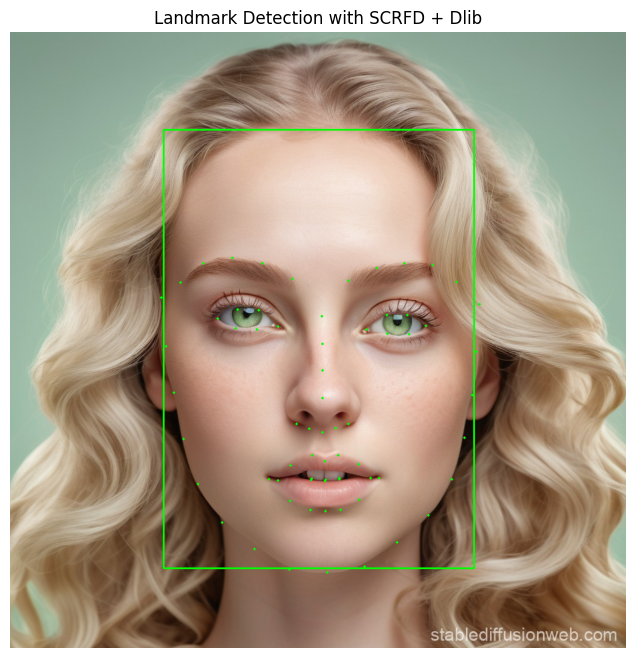

In [ ]:
for face in faces:
    x1, y1, x2, y2 = map(int, face.bbox)

    # Cắt vùng khuôn mặt
    face_crop = imgf_rgb[y1:y2, x1:x2]

    # Chuyển sang ảnh xám để Dlib xử lý
    face_gray = cv2.cvtColor(face_crop, cv2.COLOR_RGB2GRAY)
    rect = dlib.rectangle(0, 0, face_crop.shape[1], face_crop.shape[0])

    # Phát hiện landmark
    landmarks = predictor(face_gray, rect)

    # 3. Vẽ landmark lên ảnh gốc
    for n in range(0, 68):
        x = landmarks.part(n).x + x1
        y = landmarks.part(n).y + y1
        cv2.circle(imgf_rgb, (x, y), 2, (0, 255, 0), -1)

# Hiển thị kết quả
plt.figure(figsize=(8, 8))
plt.imshow(imgf_rgb)
plt.axis('off')
plt.title("Landmark Detection with SCRFD + Dlib")
plt.show()

In [ ]:
def add_alpha_channel(image):
    """Thêm Alpha channel vào ảnh RGB"""
    if image.shape[2] == 3:
        # Tạo kênh alpha đầy đủ (255 - không trong suốt)
        alpha_channel = np.ones((image.shape[0], image.shape[1], 1), dtype=image.dtype) * 255
        image = np.concatenate((image, alpha_channel), axis=2)
    return image

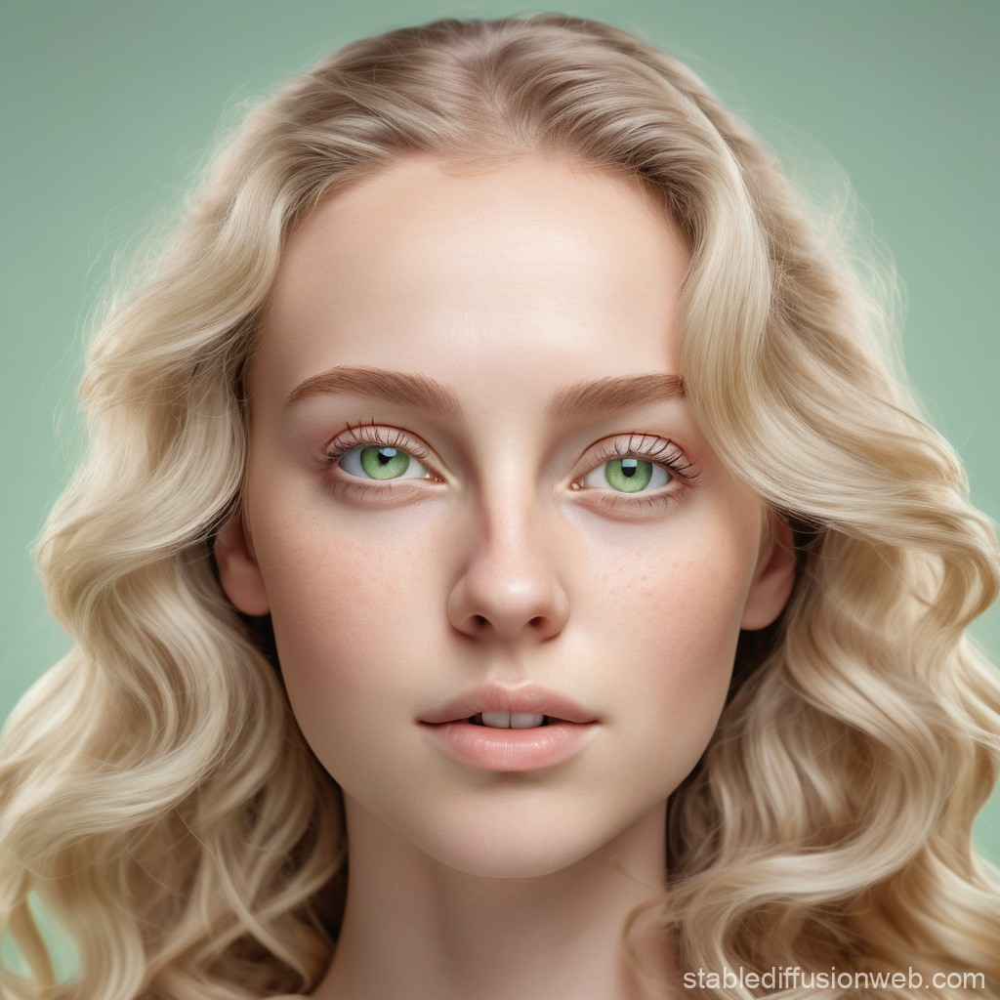

In [ ]:
test_img = imgf.copy()
cv2_imshow(test_img)

In [ ]:
glasses = cv2.imread("/content/drive/MyDrive/CV_Lab/kinh.png", cv2.IMREAD_UNCHANGED)
glasses = add_alpha_channel(glasses)

hat = cv2.imread("/content/drive/MyDrive/CV_Lab/hat.jpg", cv2.IMREAD_UNCHANGED)
hat = add_alpha_channel(hat)

In [ ]:
def overlay_filter(bg_imgf, filter_img, x, y, w, h):
    """Dán filter (PNG) lên ảnh"""
    filter_resized = cv2.resize(filter_img, (w, h))

    for i in range(h):
        for j in range(w):
            if filter_resized[i, j][3] != 0:  # Alpha channel
                if 0 <= y + i < bg_imgf.shape[0] and 0 <= x + j < bg_imgf.shape[1]:
                    bg_imgf[y + i, x + j] = filter_resized[i, j][:3]

# Dán filter vào vị trí mắt (giữa điểm 36 và 45)
for face in faces:
    x1, y1, x2, y2 = map(int, face.bbox)
    face_crop = test_img[y1:y2, x1:x2]
    face_gray = cv2.cvtColor(face_crop, cv2.COLOR_RGB2GRAY)
    rect = dlib.rectangle(0, 0, face_crop.shape[1], face_crop.shape[0])
    landmarks = predictor(face_gray, rect)

    # Lấy điểm mắt trái (36) và mắt phải (45)
    left_eye = (landmarks.part(36).x + x1, landmarks.part(36).y + y1)
    right_eye = (landmarks.part(45).x + x1, landmarks.part(45).y + y1)

    # Tính kích thước filter
    eye_width = right_eye[0] - left_eye[0]
    filter_w = eye_width * 2
    filter_h = int(filter_w * glasses.shape[0] / glasses.shape[1])

    # Vị trí đặt filter
    filter_x = left_eye[0] - eye_width // 2
    filter_y = left_eye[1] - filter_h // 2

    # Dán filter
    overlay_filter(test_img, glasses, filter_x, filter_y, filter_w, filter_h)

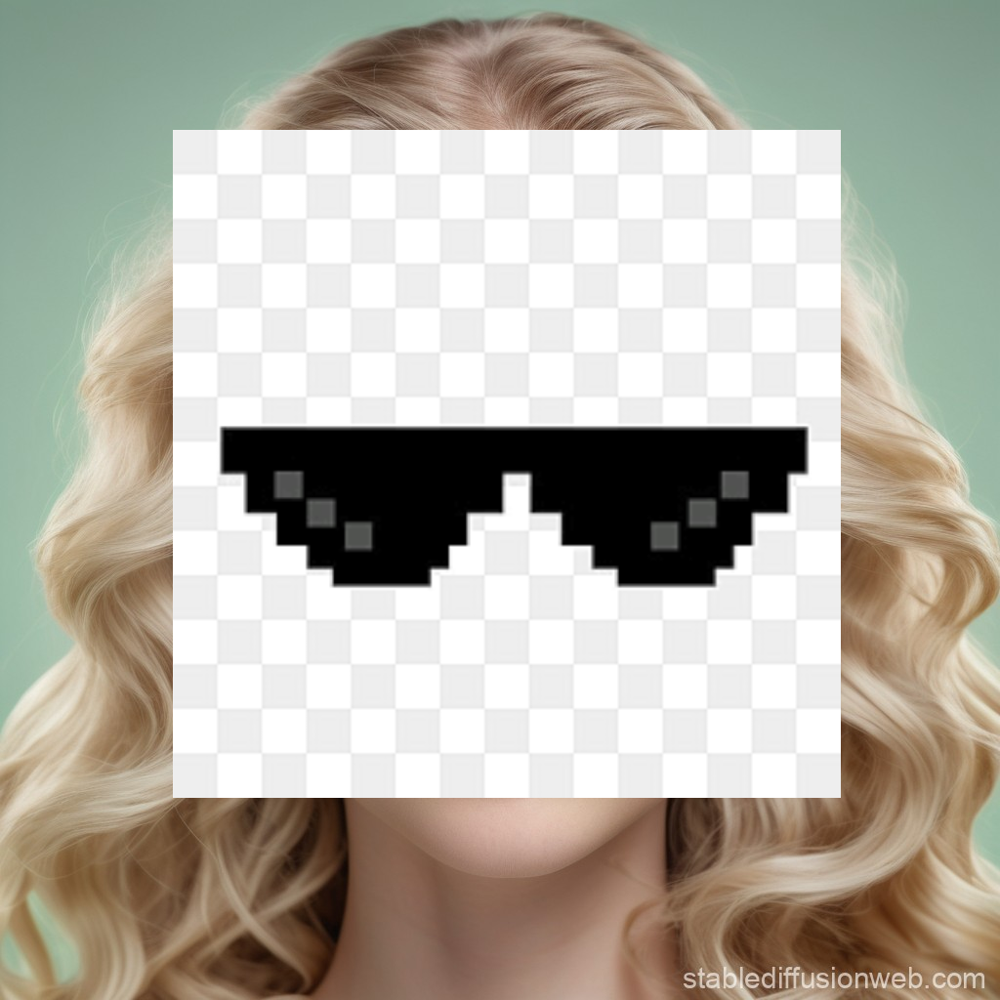

In [ ]:
cv2_imshow(test_img)

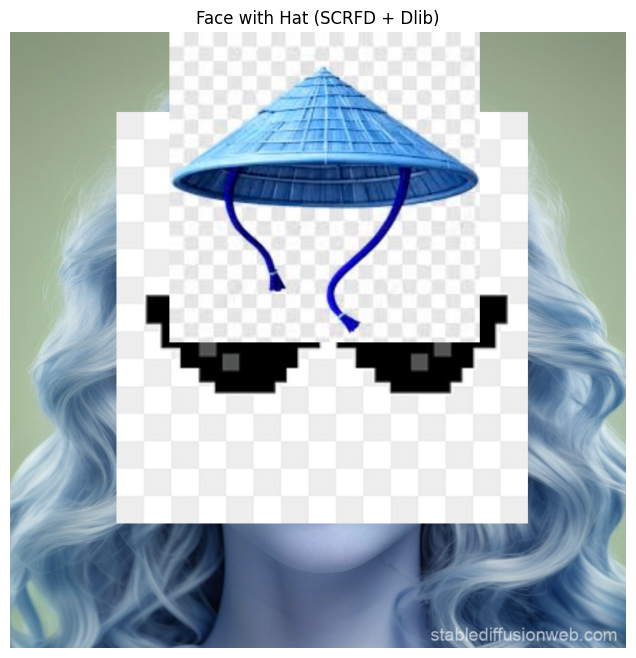

In [ ]:
for face in faces:
    x1, y1, x2, y2 = map(int, face.bbox)
    face_crop = test_img[y1:y2, x1:x2]

    # Chuyển ảnh cắt khuôn mặt sang ảnh xám để Dlib nhận diện
    face_gray = cv2.cvtColor(face_crop, cv2.COLOR_RGB2GRAY)
    rect = dlib.rectangle(0, 0, face_crop.shape[1], face_crop.shape[0])

    # Phát hiện landmark
    landmarks = predictor(face_gray, rect)

    # Lấy điểm 27 (trán) và 8 (cằm) để ước lượng vị trí đỉnh đầu
    nose_bridge = landmarks.part(27)
    chin = landmarks.part(8)

    # Tính khoảng cách từ trán đến cằm để ước lượng vị trí đỉnh đầu
    height = chin.y - nose_bridge.y
    hat_y = max(y1 + nose_bridge.y - 2 * height, 0)  # Đặt nón cao hơn trán
    hat_x = x1 + nose_bridge.x - (x2 - x1) // 2      # Căn giữa

    # Tính kích thước nón (bằng với chiều rộng khuôn mặt)
    hat_width = x2 - x1
    hat_height = int(hat_width * hat.shape[0] / hat.shape[1])

    # Dán nón lên đầu
    overlay_filter(test_img, hat, hat_x, hat_y, hat_width, hat_height)

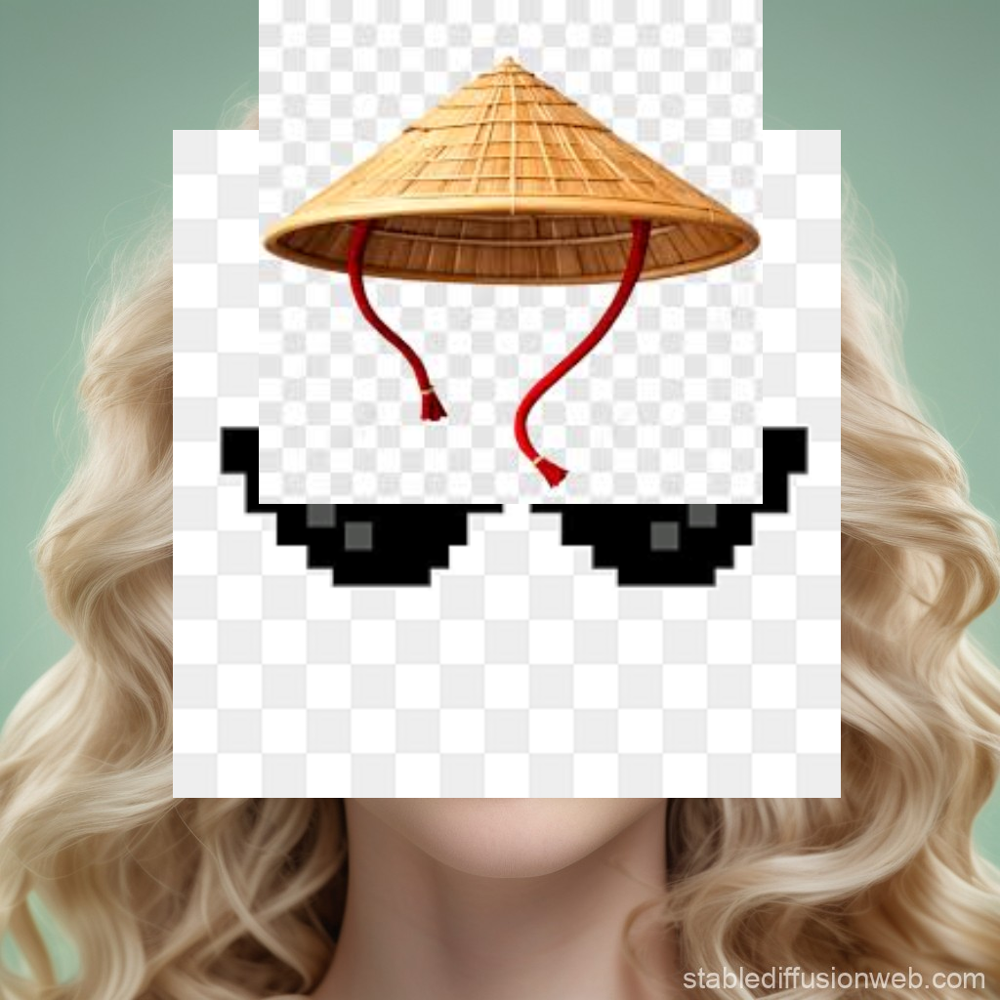

In [ ]:
cv2_imshow(test_img)